# Lab Notebook 16

In this notebook, we explore principal component analysis, a very popular method used for dimensionality reduction. We will apply PCA to Sloan Digital Sky Survey (SDSS) spectra and galaxy images.

*Modified from: Viviana Acquaviva (2023); see also other code credits below.
License: [BSD-3-clause](https://opensource.org/license/bsd-3-clause/)*

In [1]:
import numpy as np
import pandas as pd
import os
import random
import matplotlib.pyplot as plt

from sklearn import preprocessing, decomposition
import skimage
from skimage.transform import resize, rescale
from skimage import io

# Dimensionality Reduction Introduction

Principal Component Analysis (PCA) and similar algorithms are used for dimensionality reduction in data-intensive sciences. 

The main goal of linear PCA is to find the most representative linear combinations of features, so that each element of a data set can be expressed as the superposition (sum) of some salient vectors in feature space (they don't need to be elements of a data set.) In the simplest linear PCA, the principal components are the eigenvectors of the covariance matrix of the data set.

If the number of components is very low (e.g. 2 or 3), PCA or other Dimensionality Reduction methods allow one to visualize a high-dimensional data set as a 2D or 3D plot. Scikit-learn has methods to compute PCA and several variants. Classic PCA has tough complexity: $\mathcal{O}[N^3].$ 

# Let's look at an example with galaxy spectra

## Step 1

Load the data from 'spec4000_corrected.npz'. Make four arrays -- wavelengths, X, y, and labels -- containing these values. You may find it useful to print the arrays/array size to gain an understanding of the data.

In [32]:
data = np.load('spec4000_corrected.npz')

## Step 2

We can plot some representative examples from each class, just to have a sense of what kind of spectra are in the data set. Include labels.

*Hint: what are the unique values in y? Each of these values corresponds to a spectrum. Choose a few of these to plot. The plot should be wavelength on the horizontal axis and the data contained in X on the vertical axis. You could place several spectra in the same plot by offsetting them by a constant, so that they don't overlap.*

In [33]:
X = data.f.X
y = data.f.y
z = data.f.z
wavelengths = data.f.wavelengths
labels = data.f.labels

## Step 3


Our original data set has 4,000 objects and 1,000 features. We will try to represent it with a variable amount of *components*.

First, we need to make sure that the data are centered. This is an unsupervised learning process, so we don't need to distinguish between train and test sets.


*Hint: use StandardScalar and then fit_transform.*

In [34]:
scaler = preprocessing.StandardScaler()  #It's important that data are centered!
Xn = scaler.fit_transform(X)

Next, we can create our PCA decomposition of *i* components on the centered data. This calculates the eigenvectors of the covariance matrix, sorts them according to decreasing eigenvalues, and creates the projection matrix. For a slightly more explicit description, see https://ml-lectures.org/docs/structuring_data/ml_without_neural_network-1.html

Below is a piece of code that does this explicitly.

In [35]:
def pca(X, n_components):
    X_centered = X - X.mean(axis=0)
    C = np.cov(X.T)
    L, W = np.linalg.eig(C)
    idx = L.argsort()[::-1]
    L = L[idx]
    W = W[:, idx]
    Wtilde = W[:, :n_components]

    X_pca = X_centered.dot(Wtilde)

    return X_pca

1. Apply the function *pca* to our normalized data, using 20 components. Then make a scatter plot of the first two PCA components (1 and 2, not 0 and 1).

2. After that is done, repeat the calculation using sklearn's version *decomposition.PCA*. Let random_state=0. Note that to get the projection matrix, you still need to fit PCA to the data. Once that is done, plot sklearn's PCA result for the first two PCA components on top of our own version from above. Do the two methods agree?

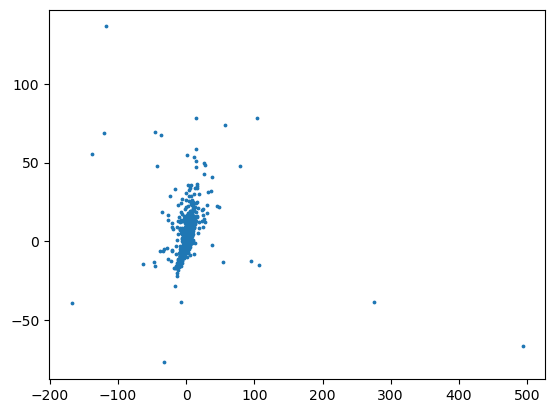

In [38]:
X_pca = pca(Xn, 20)

plt.scatter(X_pca[:,1], X_pca[:,2], s = 3)

From now on, let's proceed with sklearn's version of PCA for convenience. Repeat the decomposition for more components, 50, 100, 1000, and use fit_transform to create the reduced data sets.

In [51]:
from sklearn.decomposition import PCA

pca_50 = PCA(n_components=50)
X_pca_50 = pca_50.fit_transform(Xn)


In [52]:
pca_100 = PCA(n_components=100)
X_pca_100 = pca_100.fit_transform(Xn)


In [53]:
pca_1000 = PCA(n_components=1000)
X_pca_1000 = pca_1000.fit_transform(Xn)


## Step 4

Make a plot similar to the one in Step 2, this time plotting the projected data sets (the PCA eigenspectra). Label the components.

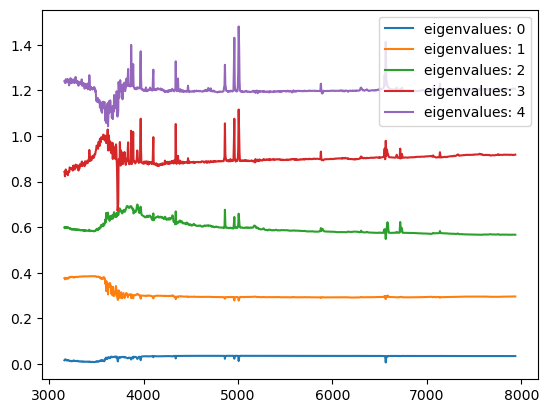

In [55]:
for i in (np.arange(5 )):
    plt.plot(wavelengths,pca_50.components_[i] + 0.3*i, label = f'eigenvalues: {i}')

plt.legend()

## Step 5

The whole process of finding PCs and projecting onto them relies on the idea of *maximizing the amount of variance captured.*

We can estimate the contribution of each component by using the property "explained variance ratio".

These are simply the eigenvalues of the covariance matrix, and they give an idea of how much each component contributes to the total variance in the data. Their cumulative sum (which we will plot a few cells below) gives the progressively increasing explained variance ratio for a given number of components.

Find, print, and then plot the "explained variance ratio" of the decomposition with 50 components:

In [26]:
pca = PCA(n_components=50)
pca.fit(Xn)

PCA(n_components=50)

In [56]:
explained_variance_ratio = pca_50.explained_variance_ratio_
print("Explained Variance Ratio:", explained_variance_ratio)

Explained Variance Ratio: [7.9755139e-01 1.2961768e-01 5.3842038e-02 6.6346461e-03 3.5946867e-03
 2.3253602e-03 9.7733713e-04 7.9977466e-04 4.9680035e-04 3.5665359e-04
 1.7710880e-04 1.4121557e-04 6.2217427e-05 5.5400025e-05 4.3599837e-05
 4.2728283e-05 3.6682541e-05 3.2562810e-05 3.1907512e-05 3.0992047e-05
 3.0439624e-05 2.8906750e-05 2.8290200e-05 2.8015244e-05 2.7184629e-05
 2.6666261e-05 2.6375521e-05 2.6032787e-05 2.5902198e-05 2.5435440e-05
 2.5166008e-05 2.4987794e-05 2.4550814e-05 2.4259289e-05 2.3740107e-05
 2.3527424e-05 2.3244202e-05 2.3071338e-05 2.2774220e-05 2.2557935e-05
 2.2397740e-05 2.2210606e-05 2.1687005e-05 2.1398344e-05 2.1128062e-05
 2.1074558e-05 2.0841879e-05 2.0740377e-05 2.0558258e-05 2.0155727e-05]


## Step 6

Let's now reverse-engineer the process. For the case with 50 components, use "inverse_transform" to find the recreated (new) representation. 

For the first four entries in the new representation, plot the percent difference (between -100% and 100%) between the original and new representation. The horizontal axis should be the wavelength.

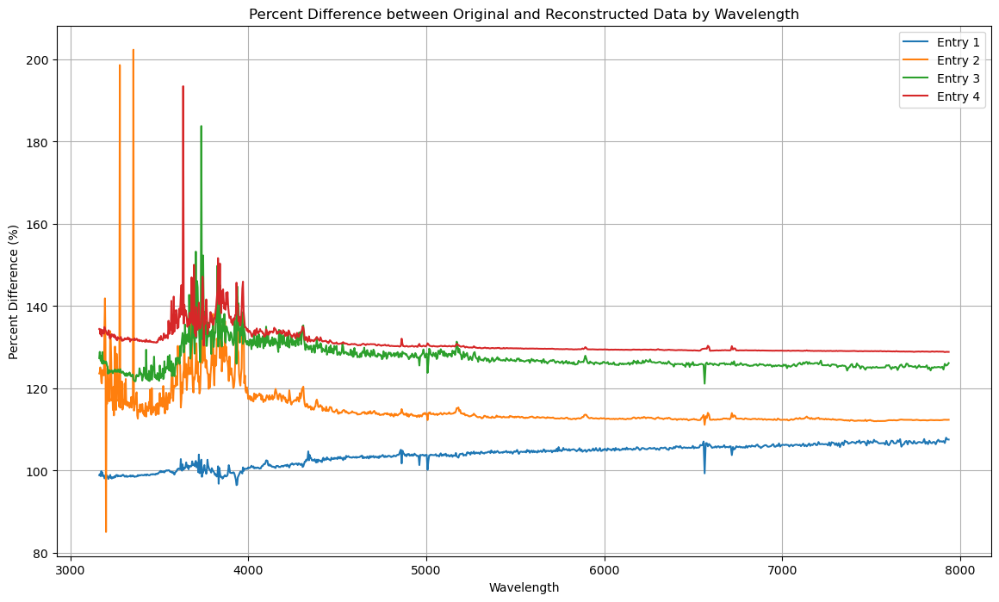

In [64]:
X_reconstructed = pca_50.inverse_transform(pca_50.fit_transform(Xn))

# Step 2: Calculate the percent difference
percent_difference = (X - X_reconstructed) / X * 100

# Step 3: Plot the percent difference for the first four entries
plt.figure(figsize=(14, 8))

# Assuming that 'wavelength' is a variable representing the wavelengths, and it's aligned with the features in X
# wavelength = np.array([...])

for i in range(4):  # Plotting only for the first four entries
    plt.plot(wavelengths, percent_difference[i, :] + 10*i, label=f'Entry {i+1}')

plt.xlabel('Wavelength')
plt.ylabel('Percent Difference (%)')
plt.title('Percent Difference between Original and Reconstructed Data by Wavelength')
plt.legend()
plt.grid(True)
plt.show()

Note that while many spectra are well represented by (for example) 50 components, some are not! 

## Step 7

Question: how can we know what is a good number of components?

To get an idea, we can plot the cumulate sum of the "explained_variance_ratio" property of the PCA decomposition. It looks a lot like the Elbow Method, but upside down; in particular, the variance explained by N components always increases with N, but there is usually a spot after which the returns tend to diminish. 

Text(0.5, 1.0, 'Elbow Plot')

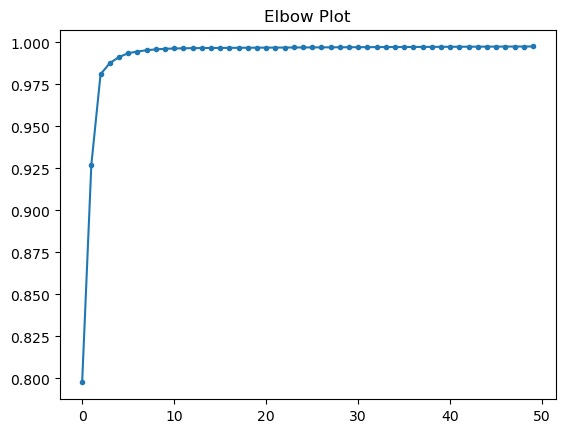

In [67]:
plt.plot(np.cumsum(pca_50.explained_variance_ratio_),'.-')
plt.title('Elbow Plot')

What would you recommend in the case above?

In [69]:
print('''
Answer:
---------------------
The first few components appear to contribute the most to the shape of the signal ( roughly 1 or 2 )
''')


Answer:
---------------------
The first few components appear to contribute the most to the shape of the signal ( roughly 1 or 2 ) 



# Sloan Digital Sky Survey

Let's now take a look at images!

## Step 8

This data set is composed of 200 images randomy selected from the Kaggle Galaxy Zoo challenge: https://www.kaggle.com/c/galaxy-zoo-the-galaxy-challenge


The code below visualizes the first 25 objects in your data set. You can run it to get a view of the first 25 galaxies. Note: you might get an error message, in this case see here: https://stackoverflow.com/questions/43288550/iopub-data-rate-exceeded-in-jupyter-notebook-when-viewing-image

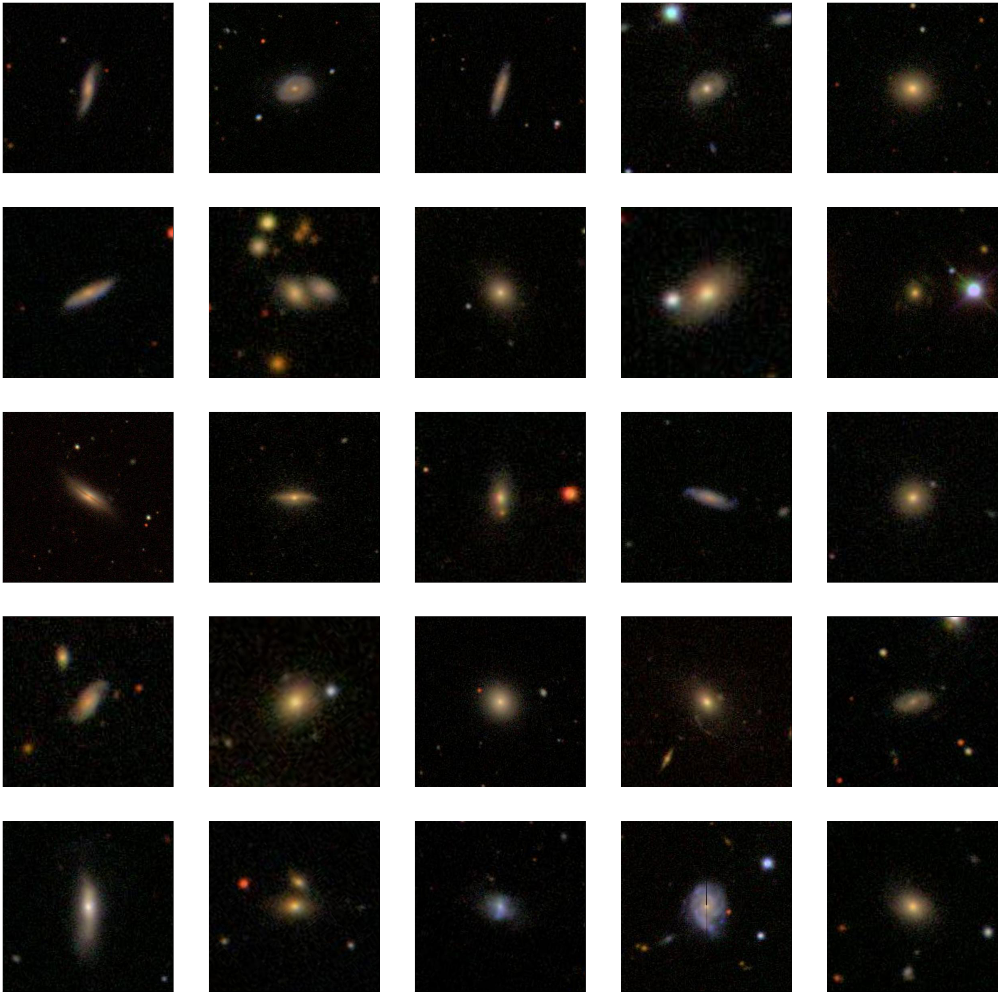

In [71]:
images = []
for i in range(200):
    img = skimage.io.imread('Images/Image_' + str(i) + '.png')
    img_resized = resize(img, (100, 100))
    length = np.prod(img_resized.shape)
    img_resized = np.reshape(img_resized, length)
    images.append(img_resized)

images = np.vstack(images)

fig, axes = plt.subplots(ncols=5, nrows=5, figsize=(50, 50))

ax = axes.ravel()

for i in range(ax.shape[0]):
    img = skimage.io.imread('Images/Image_' + str(i) + '.png')
    ax[i].imshow(img, cmap='gray')
    ax[i].set_xticks([])
    ax[i].set_yticks([])

plt.show()

## Step 9

We will now do the PCA decomposition on each of the RGB channels separately. Let's look at the red channel first.

Define "r_images" as follows:

        r_images = images.reshape(200, -1,  3)[:,:,0]
        
Using n_components=100, do a PCA decomposition on r_images.

In [75]:
r_images = images.reshape(200, -1,  3)[:,:,0]

pca_100_images = PCA(n_components=100)
r_images_pca_100 = pca_100_images.fit_transform(r_images)

Find the components array and print its shape:

In [77]:
print(pca_100_images.components_.shape)

(100, 10000)


## Step 10

Now, plot the first 50 components using imshow as above. It is best to combine these 50 images in one plot using subplots, as above. From this plot, would you guess an optimal number of components?

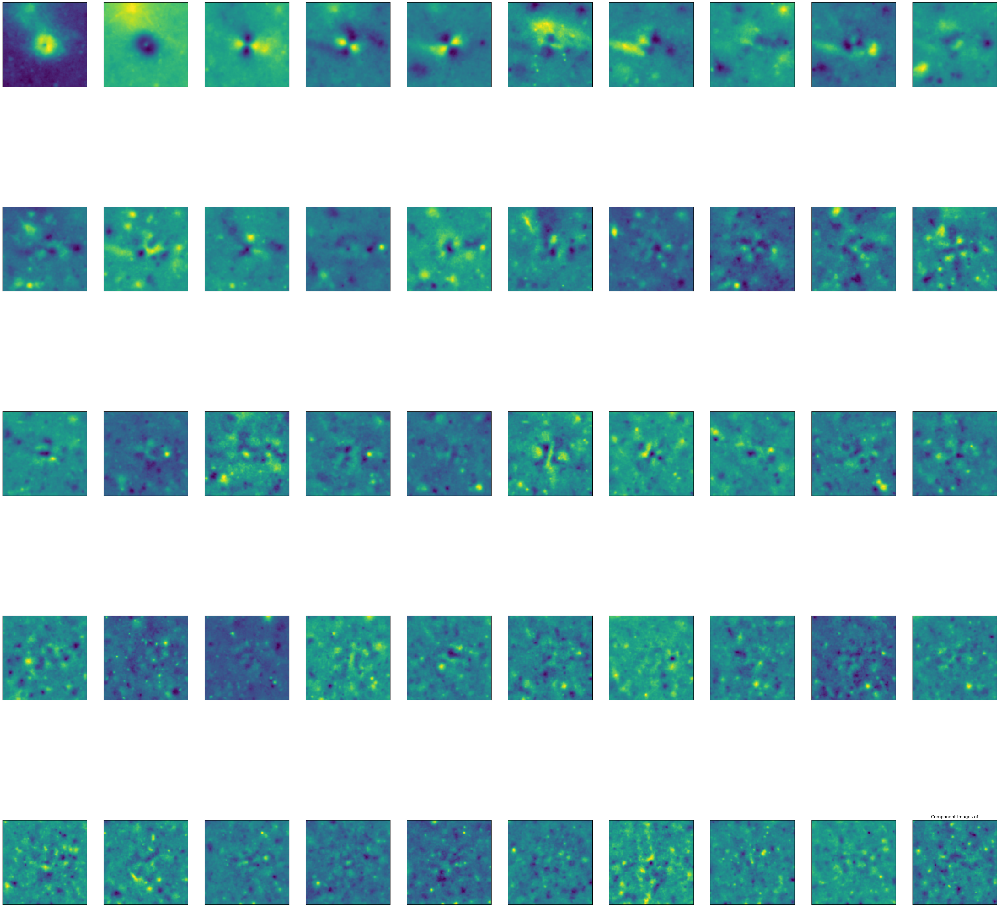

In [85]:
fig, axes = plt.subplots(ncols=10, nrows=5, figsize=(50, 50))

ax = axes.ravel()

for i in range(ax.shape[0]):
    img = pca_100_images.components_[i].reshape(100,100)
    ax[i].imshow(img)
    ax[i].set_xticks([])
    ax[i].set_yticks([])

plt.show()

We can use the explained variance ratio to see if there is an obvious optimal number of components. Plot the cumulate sum of the explained variance ratio below:

Text(0.5, 1.0, 'Elbow Plot')

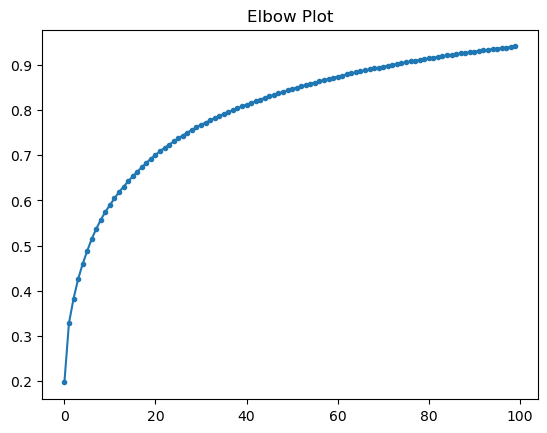

In [86]:
plt.plot(np.cumsum(pca_100_images.explained_variance_ratio_),'.-')
plt.title('Elbow Plot')

Note how different this plot is, compared to the case above, with the variance more equally distributed among many components. From this graph, approximately how many components do we need in order to retain ~ 90% of the variance?

In [87]:
print('''
Answers:
-------------------------------------
It appears that the variance contributes more evenly the more components we add as compared with the 1D spectral data ''')


Answers:
-------------------------------------
It appears that the variance contributes more evenly the more components we add as compared with the 1D spectral data 


## Step 11

For the first 10 images, let's now reconstruct the original image from our projections (still for the red channel only). Plot your 10 original images side by side in the top row of your figure, and plot the reconstructed images side by side in the bottom row of your figure.

*Hint: use "inverse_transform" to find the reconstructed images*

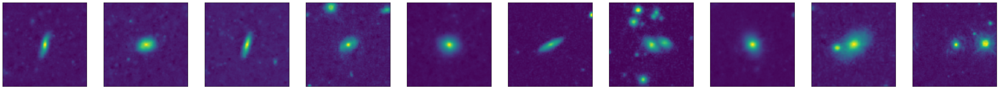

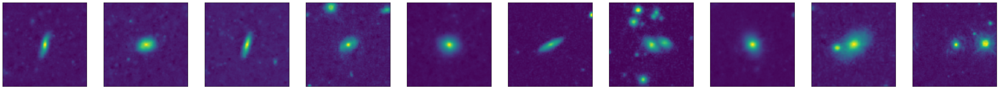

In [98]:
images_reconstructed = pca_100_images.inverse_transform(pca_100_images.fit_transform(r_images))

fig, axes = plt.subplots(ncols=10, nrows=1, figsize=(50, 50))

ax = axes.ravel()

for i in range(ax.shape[0]):
    img = images_reconstructed[i].reshape(100,100)
    ax[i].imshow(img)
    ax[i].set_xticks([])
    ax[i].set_yticks([])


plt.show()

fig, axes = plt.subplots(ncols=10, nrows=1, figsize=(50, 50))

ax = axes.ravel()

for i in range(ax.shape[0]):
    img = images_reconstructed[i].reshape(100,100)
    ax[i].imshow(img)
    ax[i].set_xticks([])
    ax[i].set_yticks([])


plt.show()

for i in range(ax.shape[0]):
    img = skimage.io.imread('Images/Image_' + str(i) + '.png')
    ax[i].imshow(img, cmap='gray')
    ax[i].set_xticks([])
    ax[i].set_yticks([])

plt.show()

## Step 12

We can reconstruct our images as above, but this time for all three channels (RGB) at once. Here is code to do this, experiment a bit with the number of components, starting a 1. When do you start seeing reasonable galaxy shapes?

In [99]:
estimator = decomposition.PCA(n_components=50)

r_images = images.reshape(200, -1, 3)[:, :, 0]
estimator.fit(r_images)
r_images_PCA = estimator.fit_transform(r_images)
r_projected = estimator.inverse_transform(r_images_PCA)

g_images = images.reshape(200, -1, 3)[:, :, 1]
estimator.fit(g_images)
g_images_PCA = estimator.fit_transform(g_images)
g_projected = estimator.inverse_transform(g_images_PCA)

b_images = images.reshape(200, -1, 3)[:, :, 2]
estimator.fit(b_images)
b_images_PCA = estimator.fit_transform(b_images)
b_projected = estimator.inverse_transform(b_images_PCA)

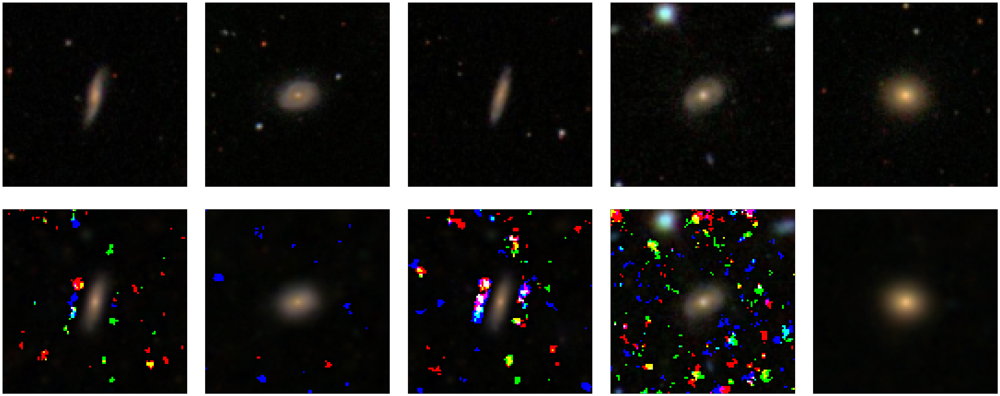

In [93]:
fig, ax = plt.subplots(2, 5, figsize=(50, 20),
                       subplot_kw={'xticks': [], 'yticks': []},
                       gridspec_kw=dict(hspace=0.1, wspace=0.1))
for i in range(5):
    ax[0, i].imshow((np.dstack([r_images[i].reshape(100, 100) * 255, g_images[i].reshape(100, 100) * 255,
                                b_images[i].reshape(100, 100) * 255]).astype(np.uint8)))
    ax[1, i].imshow((np.dstack([r_projected[i].reshape(100, 100) * 255, g_projected[i].reshape(100, 100) * 255,
                                b_projected[i].reshape(100, 100) * 255]).astype(np.uint8)))

It appears that there are some artifiacts from the reconstruction but for the most part the images appear to be viable shapes of galaxies